In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from jcopml.pipeline import num_pipe, cat_pipe
from jcopml.utils import save_model, load_model
from jcopml.plot import plot_missing_value
from jcopml.feature_importance import mean_score_decrease
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Import Dataset

### 1. Load the data of parameterization of each reservoir simulation run.
Column introduction:

    case_num: case number of each simulation run, shared and matched between df_param and df_ts;
    
    category: 'train' or 'test' tag pointing to training and testing case_num for machine/deep learning models, 20% data for                    testing, and 80% data for training purpose.

    Kh_Kv: permeability anisotropic ratio, range: 1 to 100;

    inj_rate: constant water injection rate at injection well, range: 1000 to 3000 STB/Day;

    permeability: reservoir permeability in horizontal plane or (x, y directions), range: 50 to 500 md;

    porosity: reservoir porosity, range: 0.1 to 0.3;

    prod_bhp: constant bottom-hole pressure at production well, range: 200 to 1000 psia;

    thickness: reservoir thickness, range: 10 to 100 ft;

In [2]:
df_params = pd.read_csv('data/parameters.csv')
df_params.head()

,case_num,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness
0,0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632
1,1,train,96.690954,2216.996775,127.801703,0.265198,672.408364,50.103320
2,2,train,45.990485,1494.508214,321.702554,0.109952,532.563399,73.410282
3,3,train,88.322302,2242.513803,427.275505,0.137530,976.777682,37.443929
4,4,train,27.823837,2994.073285,398.741243,0.220836,465.207942,15.788940


### 2. Load the data of time series data of each reservoir simulation run.
Column introduction:

    case_num: case number of each simulation run, shared and matched between df_param and df_ts;
    
    days: day of each time step of simulation output data, unit: day;

    years: days / 365.0, unit: year;

    oil_prod_rate: oil production rate at each time step, unit: STB/day;

    oil_prod_cum: cumulative oil production volume at each time step, it is an integration of oil_prod_rate with regards to                       days, unit: STB;

    water_inj_rate: water injection rate at each time step, unit: STB;

    water_inj_cum: cumulative water injection volume at each time step, it is an integration of water_inj_rate with regards to   days, unit: STB;

In [3]:
df_prod = pd.read_csv('data/production.csv')
df_prod.head()

,case_num,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
0,0,0,0.000000,0.0,0,0.00,0.0
1,0,31,0.084932,26614.0,825035,1740.71,53962.1
2,0,62,0.169863,21427.7,1489290,1740.71,107924.0
3,0,93,0.254795,18809.7,2072390,1740.71,161886.0
4,0,124,0.339726,16676.6,2589370,1740.71,215848.0


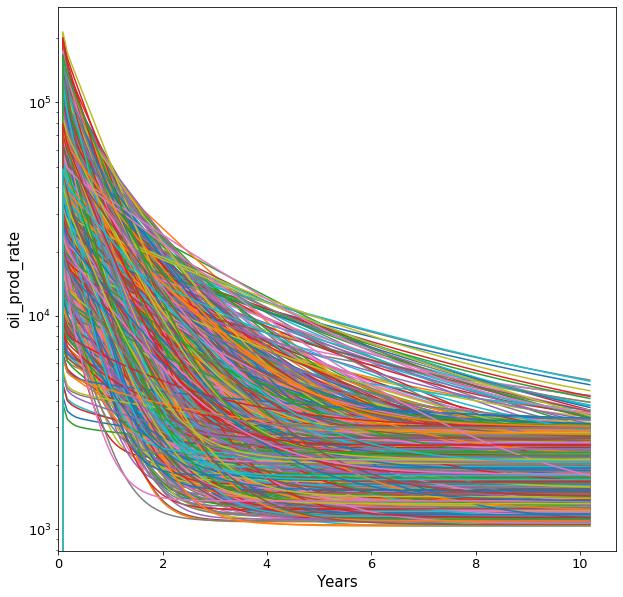

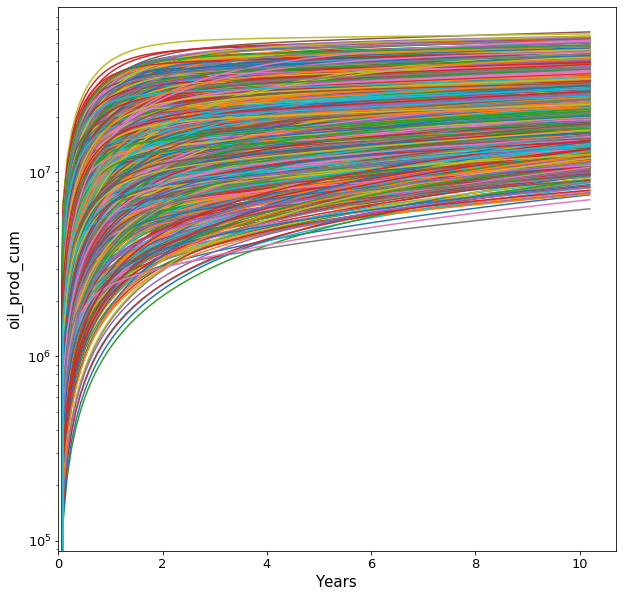

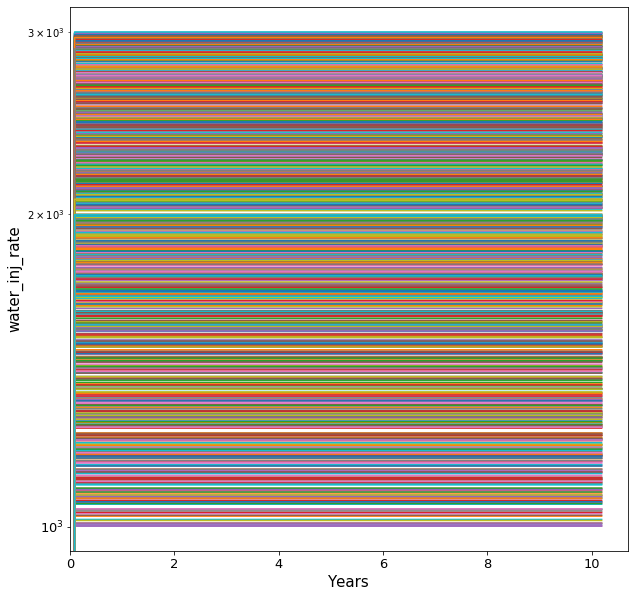

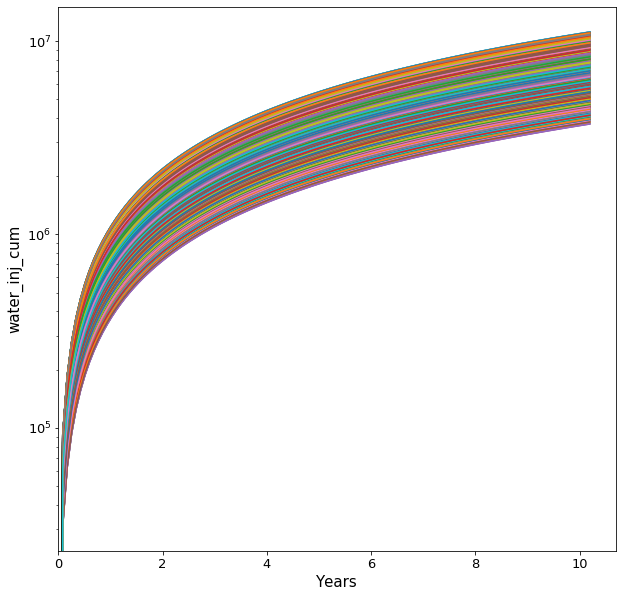

In [4]:
# Plot oil production rate
def plot_prod(df_prod, col='oil_prod_rate'):
    
    fs = 15
    
    plt.figure(figsize=(10, 10))

    for i, case in enumerate(df_prod['case_num'].unique(), 1):

        df = df_prod[(df_prod['case_num'] == case)]

        plt.semilogy(df['years'], df[col])
            
    plt.xlabel('Years', fontsize=fs)
    plt.ylabel(f'{col}', fontsize=fs)
    plt.xticks(fontsize=fs-2)
    plt.yticks(fontsize=fs-2)
    plt.xlim(xmin=0)

    plt.show()
    
# Plot the time series data 
plot_prod(df_prod, col='oil_prod_rate')
plot_prod(df_prod, col='oil_prod_cum')
plot_prod(df_prod, col='water_inj_rate')
plot_prod(df_prod, col='water_inj_cum')

# Preprocessing Data

In [5]:
df = df_params.set_index('case_num').join(df_prod.set_index('case_num'))
df.head()

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,0,0.000000,0.0,0,0.00,0.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,31,0.084932,26614.0,825035,1740.71,53962.1
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,62,0.169863,21427.7,1489290,1740.71,107924.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,93,0.254795,18809.7,2072390,1740.71,161886.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,124,0.339726,16676.6,2589370,1740.71,215848.0


In [6]:
df.to_csv('data/MergeData')

In [7]:
df.head()

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,0,0.000000,0.0,0,0.00,0.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,31,0.084932,26614.0,825035,1740.71,53962.1
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,62,0.169863,21427.7,1489290,1740.71,107924.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,93,0.254795,18809.7,2072390,1740.71,161886.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,124,0.339726,16676.6,2589370,1740.71,215848.0


In [8]:
df = pd.read_csv("data/MergeData", index_col='case_num')
df.head()

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,0,0.000000,0.0,0,0.00,0.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,31,0.084932,26614.0,825035,1740.71,53962.1
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,62,0.169863,21427.7,1489290,1740.71,107924.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,93,0.254795,18809.7,2072390,1740.71,161886.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,124,0.339726,16676.6,2589370,1740.71,215848.0


In [9]:
# To see (Mean, std, and etc) on the dataset

In [10]:
df.describe()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
count,121000.000000,121000.000000,121000.000000,121000.000000,121000.000000,121000.000000,121000.000000,121000.000000,121000.000000,1.210000e+05,121000.000000,1.210000e+05
mean,51.023587,1980.798623,276.200395,0.200145,608.556951,54.297994,1860.000000,5.095890,6529.472768,1.885091e+07,1964.428284,3.684285e+06
std,28.320670,571.374363,129.506382,0.057515,228.882490,26.344854,1082.787925,2.966542,12382.737596,1.077922e+07,596.597898,2.472309e+06
min,1.117770,1001.361112,50.622464,0.100380,200.456940,10.071005,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,26.465307,1490.288876,166.173993,0.150198,417.234602,31.280914,930.000000,2.547945,1911.242500,1.068415e+07,1472.050000,1.665965e+06
50%,51.084696,1974.114748,272.801457,0.200421,609.768186,53.629173,1860.000000,5.095890,2693.815000,1.730150e+07,1970.020000,3.357910e+06
75%,74.961078,2470.503903,389.900501,0.249404,807.944162,78.315422,2790.000000,7.643836,4838.175000,2.535298e+07,2468.940000,5.325970e+06
max,99.582172,2999.048260,499.479880,0.299785,999.951688,99.956295,3720.000000,10.191781,213798.000000,5.777660e+07,2999.050000,1.115650e+07


In [11]:
# Distribution of dataset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000021E4E946348>,
      dtype=object)

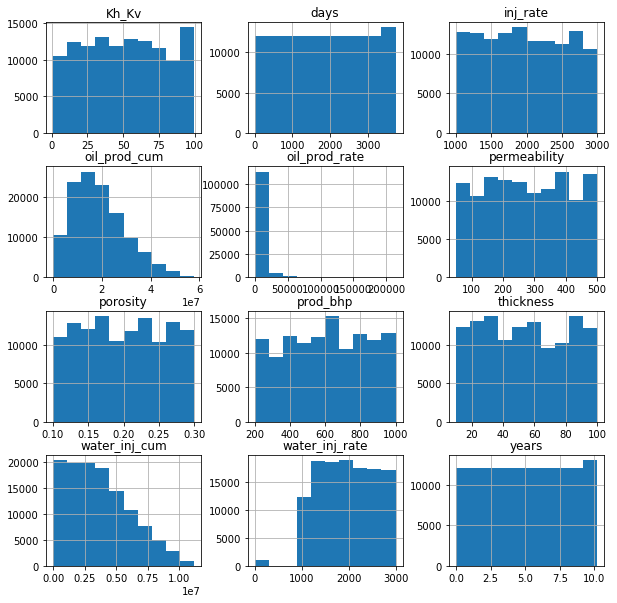

In [12]:
df.hist(figsize=(10,10))

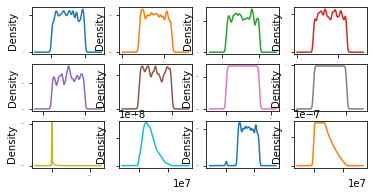

In [13]:
df.plot(kind='density', subplots=True, layout=(4,4), sharex=False, legend=False, fontsize=1)
plt.show()

In [14]:
# make sure the data is already complete

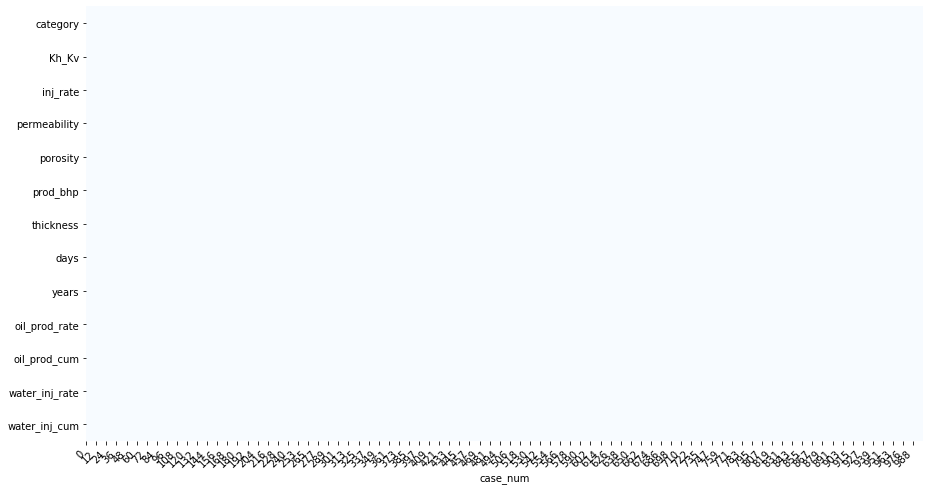

In [15]:
plot_missing_value(df)

In [16]:
# Multicollinearity

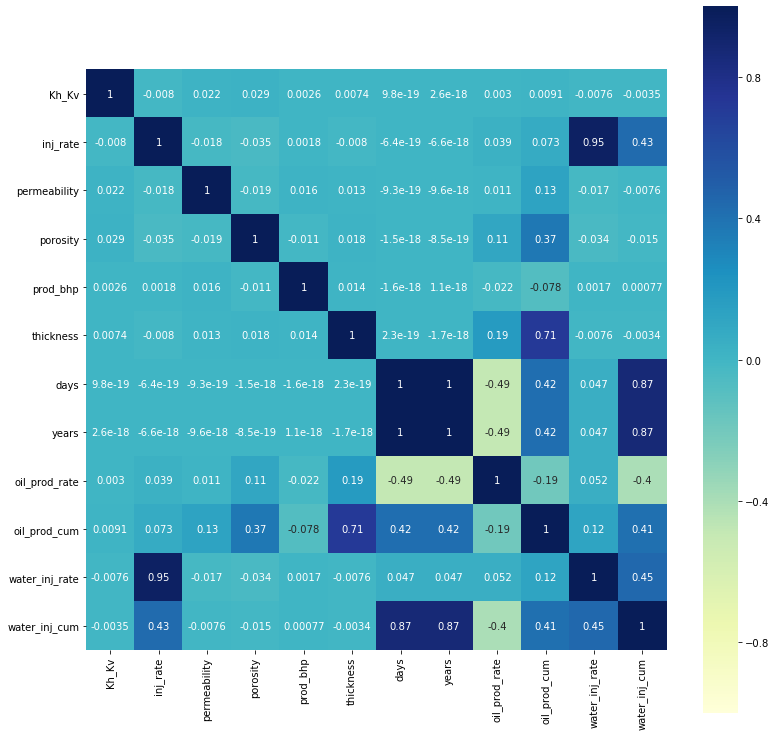

In [17]:
plt.figure(figsize=(13, 13))
sns.heatmap(df.corr(), cmap='YlGnBu', cbar='False', vmin=-1, vmax=1, annot=True, square=True)

In [18]:
df.head()

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,0,0.000000,0.0,0,0.00,0.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,31,0.084932,26614.0,825035,1740.71,53962.1
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,62,0.169863,21427.7,1489290,1740.71,107924.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,93,0.254795,18809.7,2072390,1740.71,161886.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,124,0.339726,16676.6,2589370,1740.71,215848.0


In [19]:
# Splitting the data into (Train and Test)

In [20]:
df_test =df[df.category=='test']
df_test

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,0,0.000000,0.00,0,0.00,0.0
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,31,0.084932,20856.30,646545,1671.38,51812.9
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,62,0.169863,17453.30,1187600,1671.38,103626.0
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,93,0.254795,16009.60,1683890,1671.38,155439.0
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,124,0.339726,14809.70,2143000,1671.38,207251.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,test,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,3596,9.852055,2064.30,28155300,1998.33,7185990.0
999,test,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,3627,9.936986,2062.70,28219300,1998.33,7247940.0
999,test,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,3658,10.021918,2061.20,28283200,1998.33,7309890.0


In [21]:
df_test.to_csv('data/test')

In [22]:
df_train =df[df.category=='train']
df_train

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,0,0.000000,0.00,0,0.00,0.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,31,0.084932,26614.00,825035,1740.71,53962.1
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,62,0.169863,21427.70,1489290,1740.71,107924.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,93,0.254795,18809.70,2072390,1740.71,161886.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,124,0.339726,16676.60,2589370,1740.71,215848.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,train,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,3596,9.852055,1431.77,30361500,1389.70,4997360.0
995,train,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,3627,9.936986,1430.68,30405900,1389.70,5040440.0
995,train,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,3658,10.021918,1429.67,30450200,1389.70,5083520.0


In [23]:
df_train.to_csv('data/train')

In [24]:
df_train.head()

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,0,0.000000,0.0,0,0.00,0.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,31,0.084932,26614.0,825035,1740.71,53962.1
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,62,0.169863,21427.7,1489290,1740.71,107924.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,93,0.254795,18809.7,2072390,1740.71,161886.0
0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,124,0.339726,16676.6,2589370,1740.71,215848.0


In [25]:
df_train.corr()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
Kh_Kv,1.000000e+00,-2.331968e-02,3.176222e-02,3.774471e-02,1.696469e-02,2.659169e-03,-1.913236e-18,-6.373107e-18,0.001036,0.003253,-0.022155,-0.010046
inj_rate,-2.331968e-02,1.000000e+00,-3.678550e-02,-1.370391e-02,-1.934869e-03,-1.474501e-02,-1.614763e-18,4.082855e-18,0.039575,0.074537,0.950057,0.430813
permeability,3.176222e-02,-3.678550e-02,1.000000e+00,5.652297e-03,3.319005e-02,1.751115e-02,-1.907551e-19,5.692403e-18,0.013607,0.140256,-0.034949,-0.015848
porosity,3.774471e-02,-1.370391e-02,5.652297e-03,1.000000e+00,-4.505632e-03,2.731147e-02,2.955777e-18,-8.709983e-19,0.109113,0.384965,-0.013020,-0.005904
prod_bhp,1.696469e-02,-1.934869e-03,3.319005e-02,-4.505632e-03,1.000000e+00,9.435838e-03,-8.910748e-20,-9.992136e-18,-0.021760,-0.075606,-0.001838,-0.000834
thickness,2.659169e-03,-1.474501e-02,1.751115e-02,2.731147e-02,9.435838e-03,1.000000e+00,7.300855e-19,5.833061e-18,0.183679,0.710351,-0.014009,-0.006352
days,-1.913236e-18,-1.614763e-18,-1.907551e-19,2.955777e-18,-8.910748e-20,7.300855e-19,1.000000e+00,1.000000e+00,-0.484572,0.419613,0.047010,0.866892
years,-6.373107e-18,4.082855e-18,5.692403e-18,-8.709983e-19,-9.992136e-18,5.833061e-18,1.000000e+00,1.000000e+00,-0.484572,0.419613,0.047010,0.866892
oil_prod_rate,1.035657e-03,3.957527e-02,1.360679e-02,1.091131e-01,-2.176000e-02,1.836792e-01,-4.845724e-01,-4.845724e-01,1.000000,-0.191125,0.052291,-0.400643
oil_prod_cum,3.253175e-03,7.453727e-02,1.402563e-01,3.849653e-01,-7.560613e-02,7.103508e-01,4.196129e-01,4.196129e-01,-0.191125,1.000000,0.119374,0.409452


In [26]:
df_train.columns

Index(['category', 'Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp',
       'thickness', 'days', 'years', 'oil_prod_rate', 'oil_prod_cum',
       'water_inj_rate', 'water_inj_cum'],
      dtype='object')

# Dataset Splitting

In [27]:
X = df_train.drop(columns=['category', 'oil_prod_rate', 'water_inj_rate','oil_prod_cum', 'water_inj_cum'])
y = df_train.oil_prod_cum

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((77440, 8), (19360, 8), (77440,), (19360,))

# XGBoost Algorithm

In [28]:
from sklearn.model_selection import RandomizedSearchCV
from jcopml.tuning import random_search_params as rsp
from sklearn.model_selection import GridSearchCV
from jcopml.tuning import grid_search_params as gs

In [29]:
X_train.head()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years
case_num,,,,,,,,
73,99.140980,1115.578709,116.326758,0.269365,577.384221,69.863426,186,0.509589
728,16.676311,1200.203692,143.149159,0.124712,296.557041,88.279888,2945,8.068493
79,63.651637,1447.708203,198.800015,0.182631,743.379388,73.431006,3503,9.597260
606,21.259051,2206.884336,429.396835,0.112389,231.397573,85.643563,961,2.632877
703,92.386269,1213.534504,383.689466,0.120798,365.860132,29.356725,3441,9.427397


In [30]:
rsp.xgb_params

{'algo__max_depth': Integer(low=1, high=10),
 'algo__learning_rate': Real(low=-2, high=0, prior='log-uniform'),
 'algo__n_estimators': Integer(low=100, high=200),
 'algo__subsample': Real(low=0.3, high=0.8, prior='uniform'),
 'algo__gamma': Integer(low=1, high=10),
 'algo__colsample_bytree': Real(low=0.1, high=1, prior='uniform'),
 'algo__reg_alpha': Real(low=-3, high=1, prior='log-uniform'),
 'algo__reg_lambda': Real(low=-3, high=1, prior='log-uniform')}

In [31]:
preprocessor = ColumnTransformer([
    ('numeric', num_pipe(poly=2), X.columns)
])


from xgboost import XGBRegressor
pipeline = Pipeline([
    ('prep', preprocessor),
    ('algo', XGBRegressor(n_jobs=-1, random_state=42))
])


model_XGB = RandomizedSearchCV(pipeline, rsp.xgb_poly_params, cv=3, n_iter=3, n_jobs=-1, verbose=1, random_state=42)
model_XGB.fit(X_train, y_train)

print(model_XGB.best_params_)
print(model_XGB.score(X_train, y_train), model_XGB.best_score_, model_XGB.score(X_test, y_test))

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed:   42.5s remaining:   53.2s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:  1.6min finished


{'algo__colsample_bytree': 0.48875051677790426, 'algo__gamma': 1, 'algo__learning_rate': 0.11208547084229371, 'algo__max_depth': 10, 'algo__n_estimators': 191, 'algo__reg_alpha': 7.852755494724264, 'algo__reg_lambda': 0.008532678095658717, 'algo__subsample': 0.3453032172664104, 'prep__numeric__poly__degree': 2, 'prep__numeric__poly__interaction_only': True}
0.9999326361511308 0.9996583504629347 0.999800035480973


In [32]:
from jcopml.plot import plot_actual_vs_prediction, plot_residual

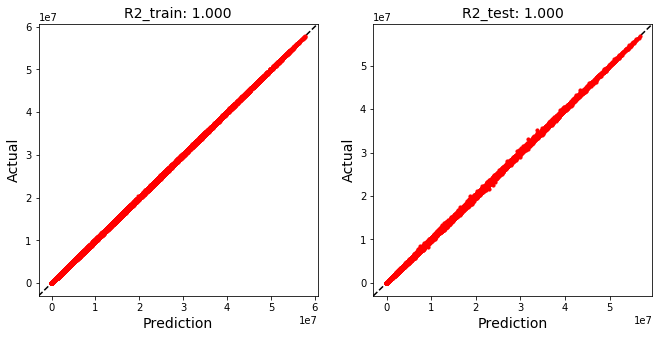

In [33]:
plot_actual_vs_prediction(X_train, y_train, X_test, y_test, model_XGB)

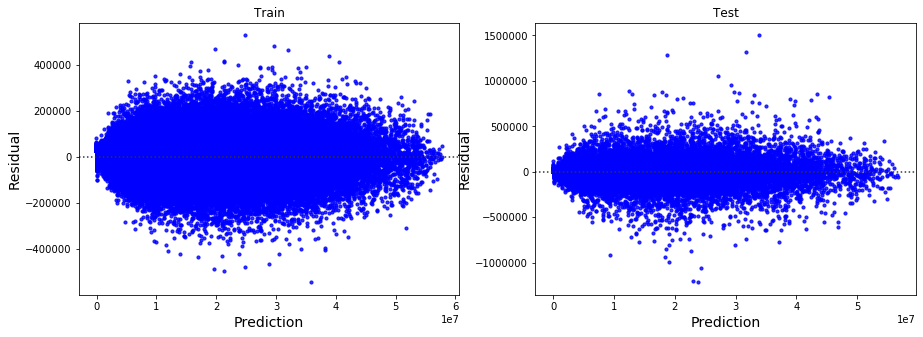

In [34]:
plot_residual(X_train, y_train, X_test, y_test, model_XGB)

# Random Forest Algorithm

In [35]:
from sklearn.model_selection import RandomizedSearchCV
from jcopml.tuning import random_search_params as rsp
from sklearn.model_selection import GridSearchCV
from jcopml.tuning import grid_search_params as gs

In [36]:
preprocessor = ColumnTransformer([
    ('numeric', num_pipe(scaling='minmax', poly=1), X.columns)
])

from sklearn.ensemble import RandomForestRegressor
pipeline = Pipeline([
    ('prep', preprocessor),
    ('algo', RandomForestRegressor(n_jobs=-1, random_state=42))
])

model_RF = RandomizedSearchCV(pipeline, rsp.rf_params, cv=3, n_iter=3, n_jobs=-1, verbose=1, random_state=42)
model_RF.fit(X_train, y_train)

print(model_RF.best_params_)
print(model_RF.score(X_train, y_train), model_RF.best_score_, model_RF.score(X_test, y_test))

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed:   27.4s remaining:   34.3s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:   31.0s finished


{'algo__max_depth': 30, 'algo__max_features': 0.5133240027692805, 'algo__min_samples_leaf': 4, 'algo__n_estimators': 123}
0.9997976559260119 0.9992197713947952 0.9995443503072095


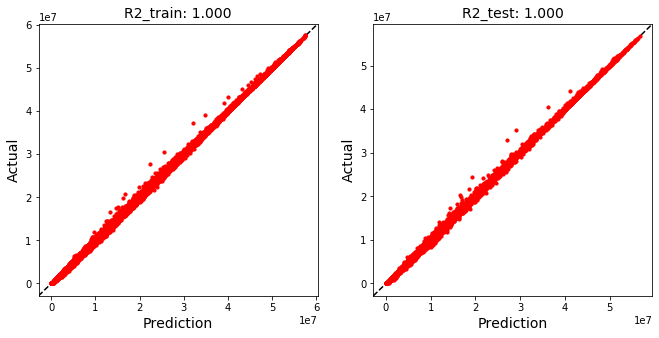

In [37]:
plot_actual_vs_prediction(X_train, y_train, X_test, y_test, model_RF)

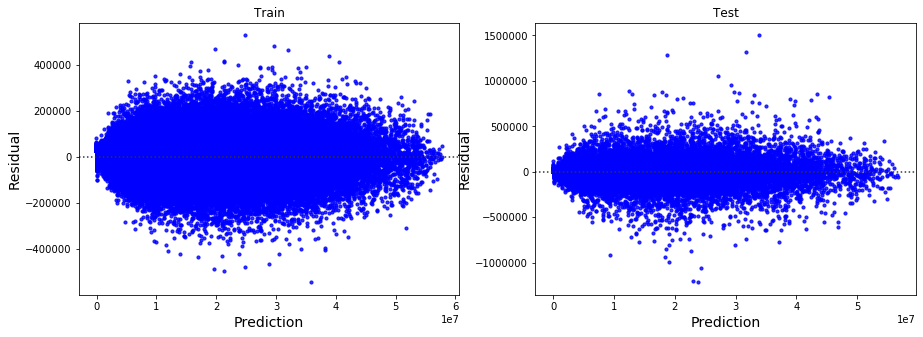

In [38]:
plot_residual(X_train, y_train, X_test, y_test, model_XGB)

# Linear Regression Algorithm

In [39]:
from sklearn.model_selection import RandomizedSearchCV
from jcopml.tuning import random_search_params as rsp
from sklearn.model_selection import GridSearchCV
from jcopml.tuning import grid_search_params as gs

In [40]:
preprocessor = ColumnTransformer([
    ('numeric', num_pipe(poly = 3), X.columns)
])

from sklearn.linear_model import LinearRegression
pipeline = Pipeline([
    ('prep', preprocessor),
    ('algo', LinearRegression())
])


model_lr = RandomizedSearchCV(pipeline, rsp.linreg_poly_params, cv=3, n_iter=50, n_jobs=-1, verbose=1, random_state=42)
model_lr.fit(X_train, y_train)

print(model_lr.best_params_)
print(model_lr.score(X_train, y_train), model_lr.best_score_, model_lr.score(X_test, y_test))

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:   12.2s finished


{'algo__fit_intercept': False, 'prep__numeric__poly__degree': 3, 'prep__numeric__poly__interaction_only': False}
0.9827664407711563 0.9826888067506286 0.9825306977355972


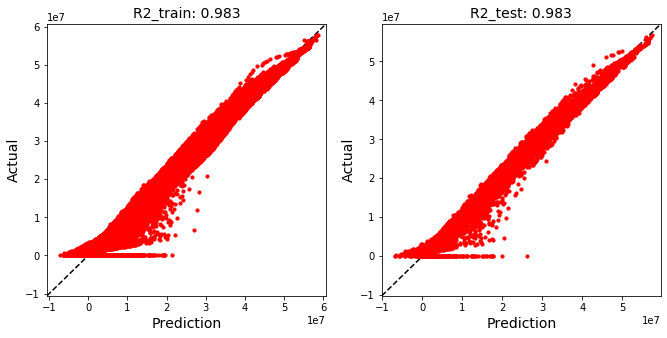

In [41]:
plot_actual_vs_prediction(X_train, y_train, X_test, y_test, model_lr)

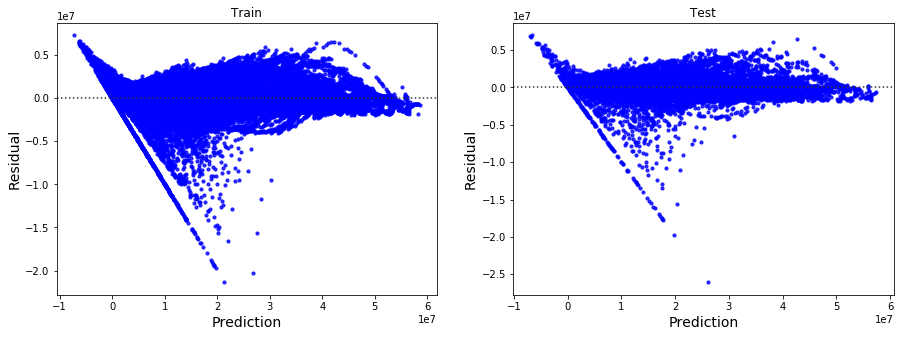

In [42]:
plot_residual(X_train, y_train, X_test, y_test, model_lr)

# Save Model

In [43]:
from jcopml.utils import save_model
from jcopml.utils import load_model

In [44]:
save_model(model_lr, "EnergyHarvest_lr")
save_model(model_XGB, "EnergyHarvest_XGB")
save_model(model_RF, "EnergyHarvest_RF")

Model is pickled as model/EnergyHarvest_lr
Model is pickled as model/EnergyHarvest_XGB
Model is pickled as model/EnergyHarvest_RF


# Finishing

In [45]:
oil_prod_cum_test = model_XGB.predict(X_test)
oil_prod_cum_test = model_RF.predict(X_test)
oil_prod_cum_test = model_lr.predict(X_test)

In [46]:
oil_prod_cum_train = model_XGB.predict(X_train)
oil_prod_cum_train = model_RF.predict(X_train)
oil_prod_cum_train = model_lr.predict(X_train)

In [47]:
load_model('model/EnergyHarvest_lr')
load_model('model/EnergyHarvest_XGB')
load_model('model/EnergyHarvest_RF')

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=Pipeline(memory=None,
                                      steps=[('prep',
                                              ColumnTransformer(n_jobs=None,
                                                                remainder='drop',
                                                                sparse_threshold=0.3,
                                                                transformer_weights=None,
                                                                transformers=[('numeric',
                                                                               Pipeline(memory=None,
                                                                                        steps=[('imputer',
                                                                                                SimpleImputer(add_indicator=False,
                                                                                         

In [48]:
X_train.head()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years
case_num,,,,,,,,
73,99.140980,1115.578709,116.326758,0.269365,577.384221,69.863426,186,0.509589
728,16.676311,1200.203692,143.149159,0.124712,296.557041,88.279888,2945,8.068493
79,63.651637,1447.708203,198.800015,0.182631,743.379388,73.431006,3503,9.597260
606,21.259051,2206.884336,429.396835,0.112389,231.397573,85.643563,961,2.632877
703,92.386269,1213.534504,383.689466,0.120798,365.860132,29.356725,3441,9.427397


In [49]:
df_test = pd.read_csv('data/test', index_col = 'case_num')
df_test

,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
case_num,,,,,,,,,,,,,
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,0,0.000000,0.00,0,0.00,0.0
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,31,0.084932,20856.30,646545,1671.38,51812.9
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,62,0.169863,17453.30,1187600,1671.38,103626.0
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,93,0.254795,16009.60,1683890,1671.38,155439.0
9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,124,0.339726,14809.70,2143000,1671.38,207251.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,test,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,3596,9.852055,2064.30,28155300,1998.33,7185990.0
999,test,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,3627,9.936986,2062.70,28219300,1998.33,7247940.0
999,test,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,3658,10.021918,2061.20,28283200,1998.33,7309890.0


In [50]:
df_test.columns

Index(['category', 'Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp',
       'thickness', 'days', 'years', 'oil_prod_rate', 'oil_prod_cum',
       'water_inj_rate', 'water_inj_cum'],
      dtype='object')

In [51]:
df_test.drop(columns = (['category', 'oil_prod_rate', 'water_inj_rate', 'water_inj_cum']), inplace = True)
df_test.head()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_cum
case_num,,,,,,,,,
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,0,0.000000,0
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,31,0.084932,646545
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,62,0.169863,1187600
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,93,0.254795,1683890
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,124,0.339726,2143000


In [52]:
input_variable_test = df_test.drop(columns = 'oil_prod_cum')

In [53]:
X_train.head()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years
case_num,,,,,,,,
73,99.140980,1115.578709,116.326758,0.269365,577.384221,69.863426,186,0.509589
728,16.676311,1200.203692,143.149159,0.124712,296.557041,88.279888,2945,8.068493
79,63.651637,1447.708203,198.800015,0.182631,743.379388,73.431006,3503,9.597260
606,21.259051,2206.884336,429.396835,0.112389,231.397573,85.643563,961,2.632877
703,92.386269,1213.534504,383.689466,0.120798,365.860132,29.356725,3441,9.427397


In [54]:
input_variable_test.head()

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years
case_num,,,,,,,,
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,0,0.000000
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,31,0.084932
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,62,0.169863
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,93,0.254795
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,124,0.339726


In [55]:
oil_prod_cum_Predict_XGB = model_XGB.predict(input_variable_test)
oil_prod_cum_Predict_RF = model_RF.predict(input_variable_test)
oil_prod_cum_Predict_lr = model_lr.predict(input_variable_test)

In [56]:
df_test.insert(8, column = 'oil_prod_cum_XGB', value = oil_prod_cum_Predict_XGB, allow_duplicates = False)
df_test.insert(8, column = 'oil_prod_cum_RF', value = oil_prod_cum_Predict_RF, allow_duplicates = False)
df_test.insert(8, column = 'oil_prod_cum_LR', value = oil_prod_cum_Predict_lr, allow_duplicates = False)

In [57]:
df_test.head(20)

,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_cum_LR,oil_prod_cum_RF,oil_prod_cum_XGB,oil_prod_cum
case_num,,,,,,,,,,,,
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,0,0.000000,-3.706080e+05,2.569536e+04,1.533924e+04,0
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,31,0.084932,2.882337e+04,6.901964e+05,6.638196e+05,646545
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,62,0.169863,4.190188e+05,1.266968e+06,1.226670e+06,1187600
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,93,0.254795,8.000676e+05,1.896757e+06,1.651527e+06,1683890
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,124,0.339726,1.599704e+06,2.261009e+06,2.124336e+06,2143000
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,155,0.424658,1.947922e+06,2.768436e+06,2.586746e+06,2568170
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,186,0.509589,2.287519e+06,3.111371e+06,2.854057e+06,2962250
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,217,0.594521,2.618587e+06,3.621802e+06,3.235780e+06,3327840
9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,248,0.679452,2.941213e+06,3.904592e+06,3.440168e+06,3667340


In [58]:
X1 = df_test.years
y1 = df_test.oil_prod_cum
y2 = df_test.oil_prod_cum_XGB
y3 = df_test.oil_prod_cum_RF
y4 = df_test.oil_prod_cum_LR

Text(0, 0.5, 'Oil_Prod_Cum')

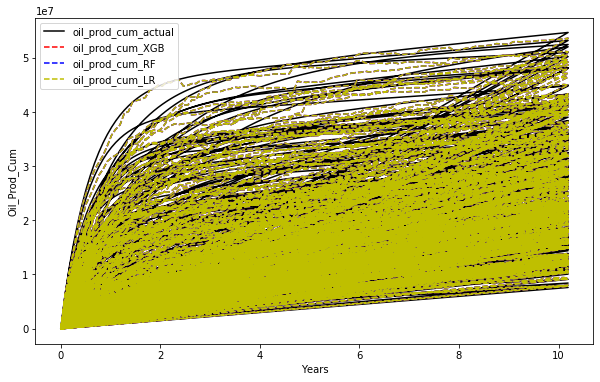

In [59]:
fig = plt.figure(figsize= (10, 6))
ax = plt.axes()

ax.plot(X1, y1, 'k-', label = 'oil_prod_cum_actual')
ax.plot(X1, y2, 'r--', label = 'oil_prod_cum_XGB')
ax.plot(X1, y2, 'b--', label = 'oil_prod_cum_RF')
ax.plot(X1, y2, 'y--', label = 'oil_prod_cum_LR')

ax.legend()
plt.xlabel('Years')
plt.ylabel('Oil_Prod_Cum')

In [60]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [61]:
y_true = df_test.oil_prod_cum
y_pred = df_test.oil_prod_cum_XGB
y_pred = df_test.oil_prod_cum_RF
y_pred = df_test.oil_prod_cum_LR

In [62]:
mean_squared_error(y_true, y_pred)

2129381307003.573

In [63]:
df_test.to_csv('Data/df_test_predict')

In [64]:
dataset_test = pd.read_csv('Data/df_test_predict')
dataset_test.head()

,case_num,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,days,years,oil_prod_cum_LR,oil_prod_cum_RF,oil_prod_cum_XGB,oil_prod_cum
0,9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,0,0.000000,-3.706080e+05,2.569536e+04,15339.237,0
1,9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,31,0.084932,2.882337e+04,6.901964e+05,663819.600,646545
2,9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,62,0.169863,4.190188e+05,1.266968e+06,1226669.600,1187600
3,9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,93,0.254795,8.000676e+05,1.896757e+06,1651527.100,1683890
4,9,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,124,0.339726,1.599704e+06,2.261009e+06,2124336.000,2143000


In [65]:
def get_rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_pred-y_true)**2.0)) 

def get_rel_l2_error(y_true, y_pred):
    return np.linalg.norm(y_true-y_pred, 2) / np.linalg.norm(y_true, 2)

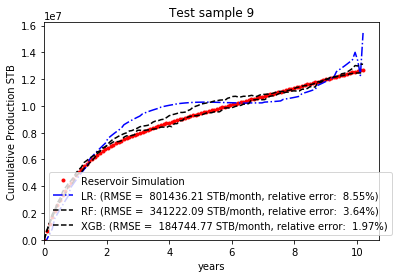

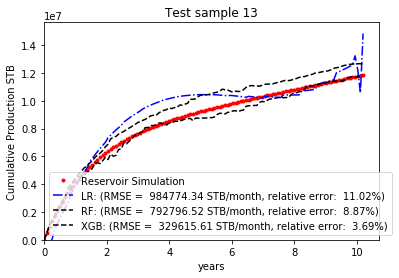

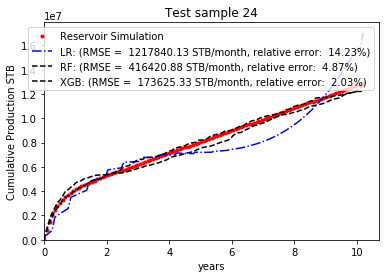

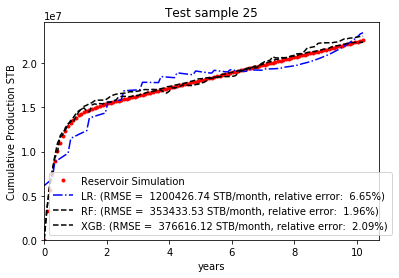

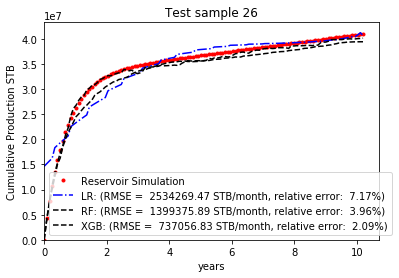

...

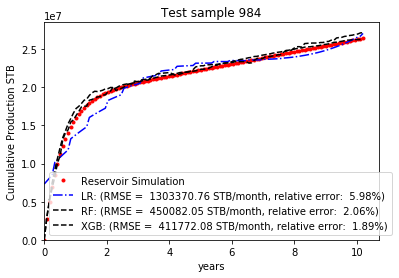

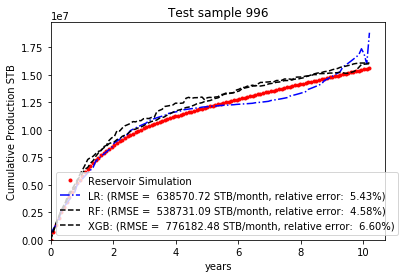

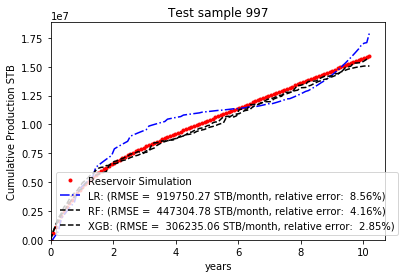

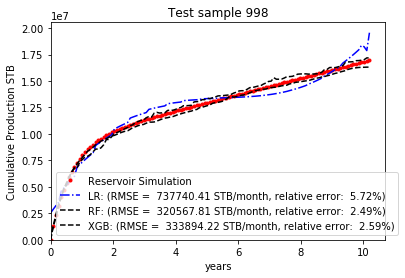

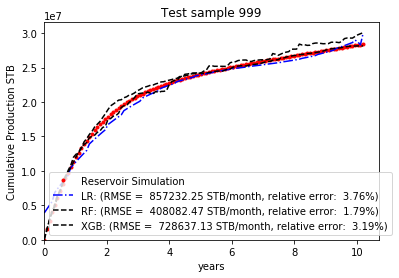

In [66]:
test_case = dataset_test['case_num'].unique()

for isample in test_case:
    
    df = dataset_test[dataset_test['case_num'] == isample]
    
    rmse_lr = get_rmse(df['oil_prod_cum'], df['oil_prod_cum_LR'])   
    rmse_RF = get_rmse(df['oil_prod_cum'], df['oil_prod_cum_RF'])
    rmse_XGB = get_rmse(df['oil_prod_cum'], df['oil_prod_cum_XGB'])   
    l2_lr = get_rel_l2_error(df['oil_prod_cum'], df['oil_prod_cum_LR']) * 100
    l2_RF = get_rel_l2_error(df['oil_prod_cum'], df['oil_prod_cum_RF']) * 100
    l2_gbm = get_rel_l2_error(df['oil_prod_cum'], df['oil_prod_cum_XGB']) * 100
    
    plt.plot(df['years'], df['oil_prod_cum'], 'r.', 
             label='Reservoir Simulation')
    plt.plot(df['years'], df['oil_prod_cum_LR'], 'b-.', 
             label=f'LR: (RMSE = {rmse_lr: .2f} STB/month, relative error: {l2_lr: .2f}%)')
    plt.plot(df['years'], df['oil_prod_cum_RF'], 'k--', 
             label=f'RF: (RMSE = {rmse_RF: .2f} STB/month, relative error: {l2_RF: .2f}%)')
    plt.plot(df['years'], df['oil_prod_cum_XGB'], 'k--', 
             label=f'XGB: (RMSE = {rmse_XGB: .2f} STB/month, relative error: {l2_gbm: .2f}%)')
        
    plt.xlim(xmin=0)
    plt.ylim(ymin=0)
    plt.xlabel('years')
    plt.ylabel('Cumulative Production STB')
    plt.title(f'Test sample {isample}')
    plt.legend()
    plt.show()   

In [67]:
score_rmse_by_XGB = get_rmse(df_test.oil_prod_cum, df_test.oil_prod_cum_XGB)
score_rmse_by_RF = get_rmse(df_test.oil_prod_cum, df_test.oil_prod_cum_RF)
score_rmse_by_LR = get_rmse(df_test.oil_prod_cum, df_test.oil_prod_cum_LR)


score_rel_error_XGB = get_rel_l2_error(df_test.oil_prod_cum, df_test.oil_prod_cum_XGB)*100
score_rel_error_RF = get_rel_l2_error(df_test.oil_prod_cum, df_test.oil_prod_cum_RF)*100
score_rel_error_LR = get_rel_l2_error(df_test.oil_prod_cum, df_test.oil_prod_cum_LR)*100

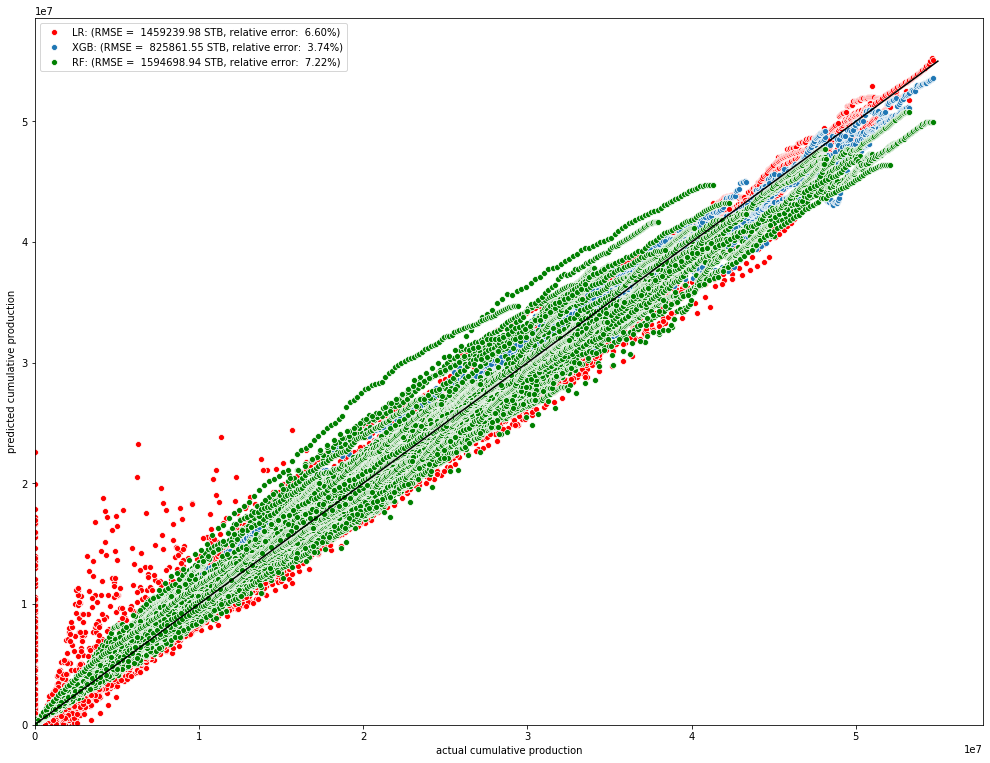

In [68]:
plt.figure(figsize = (17,13))

sns.lineplot(x = [0,55000000],y = [0,55000000],color = 'black')
sns.scatterplot(x= 'oil_prod_cum',y='oil_prod_cum_LR', data = dataset_test, color = 'red',
             label=f'LR: (RMSE = {score_rmse_by_LR: .2f} STB, relative error: {score_rel_error_LR: .2f}%)')
sns.scatterplot(x= 'oil_prod_cum',y='oil_prod_cum_XGB', data = dataset_test,
             label=f'XGB: (RMSE = {score_rmse_by_XGB: .2f} STB, relative error: {score_rel_error_XGB: .2f}%)')
sns.scatterplot(x= 'oil_prod_cum',y='oil_prod_cum_RF', data = dataset_test, color = 'green',
             label=f'RF: (RMSE = {score_rmse_by_RF: .2f} STB, relative error: {score_rel_error_RF: .2f}%)')
plt.xlim(xmin=0)
plt.ylim(ymin=0)
plt.xlabel('actual cumulative production')
plt.ylabel('predicted cumulative production')
plt.legend()
plt.show()     

In [69]:
score_rmse_by_XGB = get_rmse(df_test.oil_prod_cum, df_test.oil_prod_cum_XGB)
score_rmse_by_RF = get_rmse(df_test.oil_prod_cum, df_test.oil_prod_cum_RF)
score_rmse_by_LR = get_rmse(df_test.oil_prod_cum, df_test.oil_prod_cum_LR)


score_rel_error_XGB = get_rel_l2_error(df_test.oil_prod_cum, df_test.oil_prod_cum_XGB)*100
score_rel_error_RF = get_rel_l2_error(df_test.oil_prod_cum, df_test.oil_prod_cum_RF)*100
score_rel_error_LR = get_rel_l2_error(df_test.oil_prod_cum, df_test.oil_prod_cum_LR)*100

R_square_by_XGB = r2_score(df_test.oil_prod_cum, df_test.oil_prod_cum_XGB)
R_square_by_RF = r2_score(df_test.oil_prod_cum, df_test.oil_prod_cum_RF)
R_square_by_LR = r2_score(df_test.oil_prod_cum, df_test.oil_prod_cum_LR)


print(f'RMSE of test Cumulative production predicted by Extreme Gradient is {score_rmse_by_XGB: .3}.')
print(f'RMSE of test Cumulative production predicted by Random Forest is {score_rmse_by_RF: .3}.')
print(f'RMSE of test Cumulative production predicted by linear regression is {score_rmse_by_LR: .3}.')
print('')
print(f'relative error of test cumulative production in 10 years predicted by Extreme Gradient is {score_rel_error_XGB: .3}%.')
print(f'relative error of test cumulative production in 10 years predicted by Random Forest is {score_rel_error_RF: .3}%.')
print(f'relative error of test cumulative production in 10 years predicted by linear regression is {score_rel_error_LR: .3}%.')
print('')
print(f'R2 of test cumulative production in 10 years predicted by Gradient boost is {R_square_by_XGB: .3}.')
print(f'R2 of test cumulative production in 10 years predicted by Random Forest is {R_square_by_RF: .3}.')
print(f'R2 of test cumulative production in 10 years predicted by linear regression is {R_square_by_LR: .3}.')
print('')

RMSE of test Cumulative production predicted by Extreme Gradient is  8.26e+05.
RMSE of test Cumulative production predicted by Random Forest is  1.59e+06.
RMSE of test Cumulative production predicted by linear regression is  1.46e+06.

relative error of test cumulative production in 10 years predicted by Extreme Gradient is  3.74%.
relative error of test cumulative production in 10 years predicted by Random Forest is  7.22%.
relative error of test cumulative production in 10 years predicted by linear regression is  6.6%.

R2 of test cumulative production in 10 years predicted by Gradient boost is  0.994.
R2 of test cumulative production in 10 years predicted by Random Forest is  0.979.
R2 of test cumulative production in 10 years predicted by linear regression is  0.983.

